# Housing Rental Analysis for San Francisco

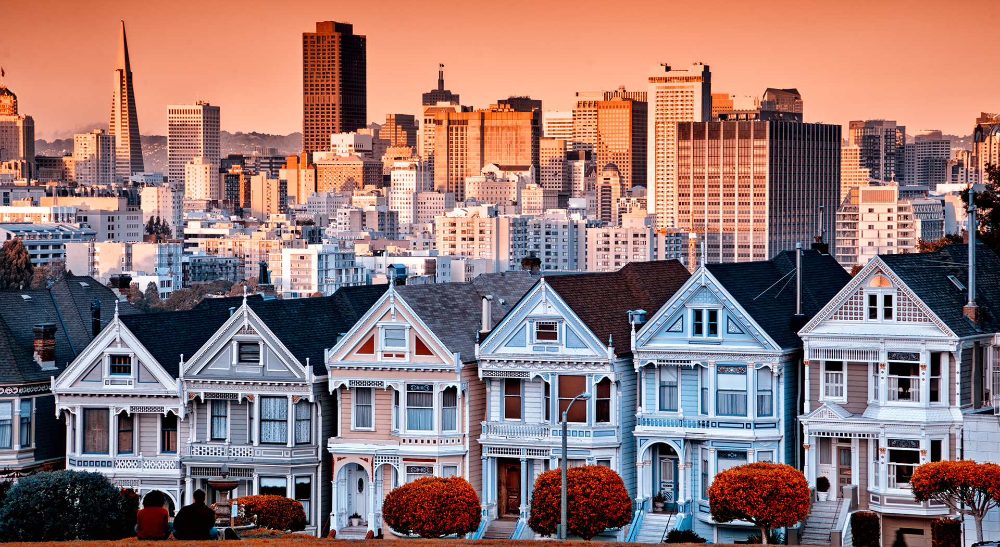

In [2]:
# Import libraries and dependencies
import pandas as pd
import hvplot.pandas
from pathlib import Path


**1. Calculate and Plot the Housing Units per Year**

In [3]:

sfo_data_df = pd.read_csv(Path('sfo_neighborhoods_census_data.csv'))

display(sfo_data_df.head())
display(sfo_data_df.tail())

,year,neighborhood,sale_price_sqr_foot,housing_units,gross_rent
0,2010,Alamo Square,291.182945,372560,1239
1,2010,Anza Vista,267.932583,372560,1239
2,2010,Bayview,170.098665,372560,1239
3,2010,Buena Vista Park,347.394919,372560,1239
4,2010,Central Richmond,319.027623,372560,1239


,year,neighborhood,sale_price_sqr_foot,housing_units,gross_rent
392,2016,Telegraph Hill,903.049771,384242,4390
393,2016,Twin Peaks,970.085470,384242,4390
394,2016,Van Ness/ Civic Center,552.602567,384242,4390
395,2016,Visitacion Valley,328.319007,384242,4390
396,2016,Westwood Park,631.195426,384242,4390


In [4]:

housing_units_by_year = sfo_data_df.groupby('year').mean()


housing_units_by_year

,sale_price_sqr_foot,housing_units,gross_rent
year,,,
2010,369.344353,372560.0,1239.0
2011,341.903429,374507.0,1530.0
2012,399.389968,376454.0,2324.0
2013,483.600304,378401.0,2971.0
2014,556.277273,380348.0,3528.0
2015,632.540352,382295.0,3739.0
2016,697.643709,384242.0,4390.0


In [5]:
# Create a visual aggregation explore the housing units by year
housing_units_by_year.hvplot.bar(y='housing_units', x = 'year', 
                                 ylabel = 'Housing Units', 
                                 xlabel = 'Year',
                                 ylim=(365000.0, 385000), 
                                 width = 700,
                                 height = 500,
                                 color = 'brown',
                                 label = 'Housing units in San Francisco from 2010 to 2016'
                                ).opts(yformatter='%.0f')

:Bars   [year]   (housing_units)

**Answer the following question:**

**Question:** What’s the overall trend in housing units over the period that you’re analyzing?

**Answer:** Housing units in San Francisco have increased every year from the year 2010 to 2016


**2. Calculate and Plot the Average Sale Prices per Square Foot**

In [6]:
# Create a numerical aggregation by grouping the data by year and averaging the results
prices_square_foot_by_year = sfo_data_df.groupby('year').mean()

# Review the resulting DataFrame
prices_square_foot_by_year

,sale_price_sqr_foot,housing_units,gross_rent
year,,,
2010,369.344353,372560.0,1239.0
2011,341.903429,374507.0,1530.0
2012,399.389968,376454.0,2324.0
2013,483.600304,378401.0,2971.0
2014,556.277273,380348.0,3528.0
2015,632.540352,382295.0,3739.0
2016,697.643709,384242.0,4390.0


In [7]:
# Calculate lowest gross rent using min()
lowest_gross_rent = prices_square_foot_by_year['gross_rent'].min()
lowest_gross_rent_index = prices_square_foot_by_year.gross_rent[prices_square_foot_by_year.gross_rent == lowest_gross_rent].index.tolist()

print(f'The lowest gross rent reported for the years included is: {lowest_gross_rent} in year {lowest_gross_rent_index[0]}.')

The lowest gross rent reported for the years included is: 1239.0 in year 2010.


**Question:** What is the lowest gross rent reported for the years included in the DataFrame?

**Answer:** The lowest gross rent reported for the years included is: 1239.0 in year 2010.

In [8]:

# Filter out the housing_units column, creating a new DataFrame 
# Keep only sale_price_sqr_foot and gross_rent averages per year
prices_square_foot_by_year.drop(columns ='housing_units', axis=1, inplace=True)

# Review the DataFrame
prices_square_foot_by_year

,sale_price_sqr_foot,gross_rent
year,,
2010,369.344353,1239.0
2011,341.903429,1530.0
2012,399.389968,2324.0
2013,483.600304,2971.0
2014,556.277273,3528.0
2015,632.540352,3739.0
2016,697.643709,4390.0


In [9]:
# Plot prices_square_foot_by_year. 
# Include labels for the x- and y-axes, and a title.
prices_square_foot_by_year.hvplot.line(y = ['sale_price_sqr_foot', 'gross_rent'],
                                       ylabel='Gross Rent/Sale Price prer Square Foot',
                                       xlabel = 'Year',
                                       legend='top',
                                       ylim = (300, 4500),
                                       width = 700,
                                       height = 500,
                                       title = 'Sale Price Per Square Foot and Average Gross Rent -2010 to 2016 - San Fransisco')

:NdOverlay   [Variable]
   :Curve   [year]   (value)

**Use both the prices_square_foot_by_year DataFrame and interactive plots to answer the following questions:**

**Question:** Did any year experience a drop in the average sale price per square foot compared to the previous year?

**Answer:** Yes, the average sale price per square foot dropped in year 2011 compared to year 2010.


**Question:** If so, did the gross rent increase or decrease during that year?

**Answer:** The gross rent increased that year.

**3. Compare the Average Sale Prices by Neighborhood**

In [10]:
# Group by year and neighborhood and then create a new dataframe of the mean values
prices_by_year_by_neighborhood = sfo_data_df.groupby(['year','neighborhood']).mean()

# Review the DataFrame
prices_by_year_by_neighborhood.head()

sale_price_sqr_foot  housing_units  gross_rent
year neighborhood                                                    
2010 Alamo Square               291.182945       372560.0      1239.0
     Anza Vista                 267.932583       372560.0      1239.0
     Bayview                    170.098665       372560.0      1239.0
     Buena Vista Park           347.394919       372560.0      1239.0
     Central Richmond           319.027623       372560.0      1239.0

In [11]:
# Filter out the housing_units
prices_by_year_by_neighborhood = sfo_data_df[['year', 'neighborhood', 'sale_price_sqr_foot', 'gross_rent']]

# Review the first and last five rows of the DataFrame
prices_by_year_by_neighborhood.head(5)

,year,neighborhood,sale_price_sqr_foot,gross_rent
0,2010,Alamo Square,291.182945,1239
1,2010,Anza Vista,267.932583,1239
2,2010,Bayview,170.098665,1239
3,2010,Buena Vista Park,347.394919,1239
4,2010,Central Richmond,319.027623,1239


In [12]:
prices_by_year_by_neighborhood.tail(5)

,year,neighborhood,sale_price_sqr_foot,gross_rent
392,2016,Telegraph Hill,903.049771,4390
393,2016,Twin Peaks,970.085470,4390
394,2016,Van Ness/ Civic Center,552.602567,4390
395,2016,Visitacion Valley,328.319007,4390
396,2016,Westwood Park,631.195426,4390


In [13]:
# Use hvplot to create an interactive line plot of the average price per square foot
# The plot should have a dropdown selector for the neighborhood
prices_by_year_by_neighborhood.hvplot.line(x='year', 
                                           y=['sale_price_sqr_foot', 'gross_rent'],
                                           ylabel='Gross Rent/Sale Price prer Square Foot', 
                                           xlabel = 'Year',
                                           legend='top',groupby= 'neighborhood', 
                                           width = 700, 
                                           height = 500,
                                           ylim = (80, 4500),
                                           label = 'Sale Price Per Square Foot and Average Gross Rent -2010 to 2016 - By Neighborhood')


:DynamicMap   [neighborhood]
   :NdOverlay   [Variable]
      :Curve   [year]   (value)

**Use the interactive visualization to answer the following question:**

**Question:** For the Anza Vista neighborhood, is the average sale price per square foot for 2016 more or less than the price that’s listed for 2012? 

**Answer:** For the Anza Vista neighborhood, the average sale price per square foot for 2016 is more than that of the price listed for 2012.

**4. Build an Interactive Neighborhood Map**

In [14]:
# Load neighborhoods coordinates data
neighborhood_locations_df = pd.read_csv(Path('neighborhoods_coordinates.csv')).set_index('Neighborhood')


# Review the DataFrame
neighborhood_locations_df.head()

,Lat,Lon
Neighborhood,,
Alamo Square,37.791012,-122.402100
Anza Vista,37.779598,-122.443451
Bayview,37.734670,-122.401060
Bayview Heights,37.728740,-122.410980
Bernal Heights,37.728630,-122.443050


In [15]:
# Calculate the mean values for each neighborhood
all_neighborhood_info_df = sfo_data_df.groupby('neighborhood').mean()

# Review the resulting DataFrame
all_neighborhood_info_df.head()

,year,sale_price_sqr_foot,housing_units,gross_rent
neighborhood,,,,
Alamo Square,2013.000000,366.020712,378401.0,2817.285714
Anza Vista,2013.333333,373.382198,379050.0,3031.833333
Bayview,2012.000000,204.588623,376454.0,2318.400000
Bayview Heights,2015.000000,590.792839,382295.0,3739.000000
Bernal Heights,2013.500000,576.746488,379374.5,3080.333333


In [16]:
# Using the Pandas `concat` function, join the 
# neighborhood_locations_df and the all_neighborhood_info_df DataFrame
# The axis of the concatenation is "columns".
# The concat function will automatially combine columns with
# identical information, while keeping the additional columns.

all_neighborhoods_df = pd.concat(
    [neighborhood_locations_df, all_neighborhood_info_df], 
    axis="columns",
    sort=False
)

# Review the resulting DataFrame
display(all_neighborhoods_df.head())
display(all_neighborhoods_df.tail())

,Lat,Lon,year,sale_price_sqr_foot,housing_units,gross_rent
Alamo Square,37.791012,-122.402100,2013.000000,366.020712,378401.0,2817.285714
Anza Vista,37.779598,-122.443451,2013.333333,373.382198,379050.0,3031.833333
Bayview,37.734670,-122.401060,2012.000000,204.588623,376454.0,2318.400000
Bayview Heights,37.728740,-122.410980,2015.000000,590.792839,382295.0,3739.000000
Bernal Heights,37.728630,-122.443050,NaN,NaN,NaN,NaN


,Lat,Lon,year,sale_price_sqr_foot,housing_units,gross_rent
Yerba Buena,37.79298,-122.39636,2012.5,576.709848,377427.5,2555.166667
Bernal Heights,NaN,NaN,2013.5,576.746488,379374.5,3080.333333
Downtown,NaN,NaN,2013.0,391.434378,378401.0,2817.285714
Ingleside,NaN,NaN,2012.5,367.895144,377427.5,2509.000000
Outer Richmond,NaN,NaN,2013.0,473.900773,378401.0,2817.285714


In [17]:
# Call the dropna function to remove any neighborhoods that do not have data
all_neighborhoods_df = all_neighborhoods_df.reset_index().dropna()

# Rename the "index" column as "Neighborhood" for use in the Visualization
all_neighborhoods_df = all_neighborhoods_df.rename(columns={"index": "Neighborhood"})

# Review the resulting DataFrame
display(all_neighborhoods_df.head())
display(all_neighborhoods_df.tail())

,Neighborhood,Lat,Lon,year,sale_price_sqr_foot,housing_units,gross_rent
0,Alamo Square,37.791012,-122.402100,2013.000000,366.020712,378401.0,2817.285714
1,Anza Vista,37.779598,-122.443451,2013.333333,373.382198,379050.0,3031.833333
2,Bayview,37.734670,-122.401060,2012.000000,204.588623,376454.0,2318.400000
3,Bayview Heights,37.728740,-122.410980,2015.000000,590.792839,382295.0,3739.000000
5,Buena Vista Park,37.768160,-122.439330,2012.833333,452.680591,378076.5,2698.833333


,Neighborhood,Lat,Lon,year,sale_price_sqr_foot,housing_units,gross_rent
68,West Portal,37.74026,-122.463880,2012.25,498.488485,376940.75,2515.500000
69,Western Addition,37.79298,-122.435790,2012.50,307.562201,377427.50,2555.166667
70,Westwood Highlands,37.73470,-122.456854,2012.00,533.703935,376454.00,2250.500000
71,Westwood Park,37.73415,-122.457000,2015.00,687.087575,382295.00,3959.000000
72,Yerba Buena,37.79298,-122.396360,2012.50,576.709848,377427.50,2555.166667


In [ ]:
# Create a plot to analyze neighborhood info
import warnings
warnings.filterwarnings("ignore")
all_neighborhoods_df.hvplot.points('Lon', 
                                   'Lat', 
                                   geo= True, 
                                   size = 'sale_price_sqr_foot', 
                                   tiles='OSM',
                                   color='gross_rent', 
                                   frame_width = 700, 
                                   frame_height = 500,
                                  )

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Lon,Lat]   (gross_rent,sale_price_sqr_foot)

**Use the interactive map to answer the following question:**


**Question** Which neighborhood has the highest gross rent, and which has the highest sale price per square foot?

**Answer:** The neighborhoods with the darkest color have highest gross rent and the neighborhood with larger size of the colors hace highest sale price per square foot.

**5. Compose Your Data Story**

**Based on the visualizations that you have created, compose a data story that synthesizes your analysis by answering the following questions:**

**Question:** How does the trend in rental income growth compare to the trend in sales prices? Does this same trend hold true for all the neighborhoods across San Francisco?

**Answer:** rental income growth trend showed increasing trend compared to sales price in San francisco. It doesnt hold true to all neighbourohoods, but majority fall into this category. Even if the sales prices fall, the rent continued to increase.

**Question:** What insights can you share with your company about the potential one-click, buy-and-rent strategy that they're pursuing? Do neighborhoods exist that you would suggest for investment, and why?

**Answer:** I would suggest my company to make use of the interactive map tool to identify neighbourhood for the buy and rent strategy. The neighbourhoods with the darker color and large size on the interactive map would be best fit for investments cos of the high rental income compared to sale price.